<p style="text-align:center">
    <a href="https://skills.network/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMDS0321ENSkillsNetwork26802033-2022-01-01" target="_blank">
    <img src="https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/assets/logos/SN_web_lightmode.png" width="200" alt="Skills Network Logo">
    </a>
</p>


# **Space X  Falcon 9 First Stage Landing Prediction**


## Hands on Lab: Complete the Machine Learning Prediction lab


Estimated time needed: **60** minutes


Space X advertises Falcon 9 rocket launches on its website with a cost of 62 million dollars; other providers cost upward of 165 million dollars each, much of the savings is because Space X can reuse the first stage. Therefore if we can determine if the first stage will land, we can determine the cost of a launch. This information can be used if an alternate company wants to bid against space X for a rocket launch.   In this lab, you will create a machine learning pipeline  to predict if the first stage will land given the data from the preceding labs.


![](https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-DS0701EN-SkillsNetwork/api/Images/landing_1.gif)


Several examples of an unsuccessful landing are shown here:


![](https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-DS0701EN-SkillsNetwork/api/Images/crash.gif)


Most unsuccessful landings are planed. Space X; performs a controlled landing in the oceans.


## Objectives


Perform exploratory  Data Analysis and determine Training Labels

*   create a column for the class
*   Standardize the data
*   Split into training data and test data

\-Find best Hyperparameter for SVM, Classification Trees and Logistic Regression

*   Find the method performs best using test data


## Import Libraries and Define Auxiliary Functions


In [1]:
# import piplite
# await piplite.install(['numpy'])
# await piplite.install(['pandas'])
# await piplite.install(['seaborn'])

We will import the following libraries for the lab


In [2]:
# Pandas is a software library written for the Python programming language for data manipulation and analysis.
import pandas as pd
# NumPy is a library for the Python programming language, adding support for large, multi-dimensional arrays and matrices, along with a large collection of high-level mathematical functions to operate on these arrays
import numpy as np
# Matplotlib is a plotting library for python and pyplot gives us a MatLab like plotting framework. We will use this in our plotter function to plot data.
import matplotlib.pyplot as plt
#Seaborn is a Python data visualization library based on matplotlib. It provides a high-level interface for drawing attractive and informative statistical graphics
import seaborn as sns
# Preprocessing allows us to standarsize our data
from sklearn import preprocessing
# Allows us to split our data into training and testing data
from sklearn.model_selection import train_test_split
# Allows us to test parameters of classification algorithms and find the best one
from sklearn.model_selection import GridSearchCV
# Logistic Regression classification algorithm
from sklearn.linear_model import LogisticRegression
# Support Vector Machine classification algorithm
from sklearn.svm import SVC
# Decision Tree classification algorithm
from sklearn.tree import DecisionTreeClassifier
# K Nearest Neighbors classification algorithm
from sklearn.neighbors import KNeighborsClassifier
from tqdm import tqdm
import mlflow

In [3]:
mlflow.set_experiment("Space-X ML Experiment")
mlflow.set_tracking_uri(uri="http://127.0.0.1:8080/")

This function is to plot the confusion matrix.


In [4]:
def plot_confusion_matrix(y,y_predict, model):
    "this function plots the confusion matrix"
    from sklearn.metrics import confusion_matrix

    cm = confusion_matrix(y, y_predict)
    ax= plt.subplot()
    sns.heatmap(cm, annot=True, ax = ax); #annot=True to annotate cells
    ax.set_xlabel('Predicted labels')
    ax.set_ylabel('True labels')
    ax.set_title(f'{model} - Confusion Matrix'); 
    ax.xaxis.set_ticklabels(['did not land', 'land']); ax.yaxis.set_ticklabels(['did not land', 'landed']) 
    plt.show() 

## Load the dataframe


Load the data


In [5]:
# from js import fetch
# import io

URL1 = "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBM-DS0321EN-SkillsNetwork/datasets/dataset_part_2.csv"
# resp1 = await fetch(URL1)
# text1 = io.BytesIO((await resp1.arrayBuffer()).to_py())
# data = pd.read_csv(text1)
data = pd.read_csv(URL1)

In [6]:
data.head()

,FlightNumber,Date,BoosterVersion,PayloadMass,Orbit,LaunchSite,Outcome,Flights,GridFins,Reused,Legs,LandingPad,Block,ReusedCount,Serial,Longitude,Latitude,Class
0,1,2010-06-04,Falcon 9,6104.959412,LEO,CCAFS SLC 40,None None,1,False,False,False,NaN,1.0,0,B0003,-80.577366,28.561857,0
1,2,2012-05-22,Falcon 9,525.000000,LEO,CCAFS SLC 40,None None,1,False,False,False,NaN,1.0,0,B0005,-80.577366,28.561857,0
2,3,2013-03-01,Falcon 9,677.000000,ISS,CCAFS SLC 40,None None,1,False,False,False,NaN,1.0,0,B0007,-80.577366,28.561857,0
3,4,2013-09-29,Falcon 9,500.000000,PO,VAFB SLC 4E,False Ocean,1,False,False,False,NaN,1.0,0,B1003,-120.610829,34.632093,0
4,5,2013-12-03,Falcon 9,3170.000000,GTO,CCAFS SLC 40,None None,1,False,False,False,NaN,1.0,0,B1004,-80.577366,28.561857,0


In [7]:
URL2 = 'https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBM-DS0321EN-SkillsNetwork/datasets/dataset_part_3.csv'
# resp2 = await fetch(URL2)
# text2 = io.BytesIO((await resp2.arrayBuffer()).to_py())
# X = pd.read_csv(text2)
X = pd.read_csv(URL2)

In [8]:
X.head(100)

,FlightNumber,PayloadMass,Flights,Block,ReusedCount,Orbit_ES-L1,Orbit_GEO,Orbit_GTO,Orbit_HEO,Orbit_ISS,...,Serial_B1058,Serial_B1059,Serial_B1060,Serial_B1062,GridFins_False,GridFins_True,Reused_False,Reused_True,Legs_False,Legs_True
0,1.0,6104.959412,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
1,2.0,525.000000,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
2,3.0,677.000000,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
3,4.0,500.000000,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
4,5.0,3170.000000,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85,86.0,15400.000000,2.0,5.0,2.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0
86,87.0,15400.000000,3.0,5.0,2.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0
87,88.0,15400.000000,6.0,5.0,5.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0
88,89.0,15400.000000,3.0,5.0,2.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0


In [9]:
results_list = {}

## TASK  1


Create a NumPy array from the column <code>Class</code> in <code>data</code>, by applying the method <code>to_numpy()</code>  then
assign it  to the variable <code>Y</code>,make sure the output is a  Pandas series (only one bracket df\['name of  column']).


In [10]:
Y = data['Class'].to_numpy()
Y

array([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1,
       1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1,
       1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1])

## TASK  2


Standardize the data in <code>X</code> then reassign it to the variable  <code>X</code> using the transform provided below.


In [11]:
# students get this 
transform = preprocessing.StandardScaler()
X = transform.fit_transform(X)

We split the data into training and testing data using the  function  <code>train_test_split</code>.   The training data is divided into validation data, a second set used for training  data; then the models are trained and hyperparameters are selected using the function <code>GridSearchCV</code>.


## TASK  3


Use the function train_test_split to split the data X and Y into training and test data. Set the parameter test_size to  0.2 and random_state to 2. The training data and test data should be assigned to the following labels.


<code>X_train, X_test, Y_train, Y_test</code>


In [12]:
# X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2)

we can see we only have 18 test samples.


In [13]:
# Y_test.shape

## TASK  4


Create a logistic regression object  then create a  GridSearchCV object  <code>logreg_cv</code> with cv = 10.  Fit the object to find the best parameters from the dictionary <code>parameters</code>.


In [14]:
parameters ={'C':[0.01,0.1,1],
             'penalty':['l2'],
             'solver':['lbfgs']}

In [15]:
def train_lr(temp_X_train, temp_X_test, temp_Y_train, temp_Y_test):
    parameters ={"C":[0.01,0.1,1],'penalty':['l2'], 'solver':['lbfgs']}# l1 lasso l2 ridge
    lr=LogisticRegression()
    logreg_cv = GridSearchCV(
        estimator=lr,
        param_grid=parameters,
        cv=10,
        scoring='accuracy',
        verbose=2
    )
    logreg_cv.fit(temp_X_train, temp_Y_train)

    # print("tuned hpyerparameters :(best parameters) ",logreg_cv.best_params_)
    # print("accuracy :",logreg_cv.best_score_)

    # lr_test_score = logreg_cv.score(temp_X_test, temp_Y_test)
    # print(lr_test_score)

    return logreg_cv

In [16]:
# logreg_cv = train_lr(X_train, X_test, Y_train, Y_test)

We output the <code>GridSearchCV</code> object for logistic regression. We display the best parameters using the data attribute <code>best_params\_</code> and the accuracy on the validation data using the data attribute <code>best_score\_</code>.


In [17]:
# print("tuned hpyerparameters :(best parameters) ",logreg_cv.best_params_)
# print("accuracy :",logreg_cv.best_score_)

## TASK  5


Calculate the accuracy on the test data using the method <code>score</code>:


In [18]:
# lr_test_score = logreg_cv.score(X_test, Y_test)
# print(lr_test_score)

In [19]:
# results_list["Linear Regression"] = lr_test_score

Lets look at the confusion matrix:


In [20]:
# yhat=logreg_cv.predict(X_test)
# plot_confusion_matrix(Y_test,yhat, "Linear Regression")

Examining the confusion matrix, we see that logistic regression can distinguish between the different classes.  We see that the problem is false positives.

Overview:

True Postive - 12 (True label is landed, Predicted label is also landed)

False Postive - 3 (True label is not landed, Predicted label is landed)


## TASK  6


Create a support vector machine object then  create a  <code>GridSearchCV</code> object  <code>svm_cv</code> with cv = 10.  Fit the object to find the best parameters from the dictionary <code>parameters</code>.


In [21]:
svm_parameters = {'kernel':('linear', 'rbf','poly','rbf', 'sigmoid'),
              'C': np.logspace(-3, 3, 5),
              'gamma':np.logspace(-3, 3, 5)}
svm = SVC()

In [22]:
def train_svm(temp_X_train, temp_X_test, temp_Y_train, temp_Y_test):
    temp_svm_parameters = {'kernel':('linear', 'rbf','poly','rbf', 'sigmoid'),
              'C': np.logspace(-3, 3, 5),
              'gamma':np.logspace(-3, 3, 5)}
    temp_svm = SVC()

    svm_cv = GridSearchCV(
        estimator=temp_svm,
        param_grid=temp_svm_parameters,
        cv=10,
        scoring="accuracy",
        verbose=2
    )
    svm_cv.fit(temp_X_train, temp_Y_train)

    # print("tuned hpyerparameters :(best parameters) ",svm_cv.best_params_)
    # print("accuracy :",svm_cv.best_score_)

    # svm_score = svm_cv.score(temp_Y_train, temp_Y_test)
    # print(svm_score)
    return svm_cv

In [23]:
temp_X_train1, temp_X_test1, temp_y_train1, temp_y_test1 = train_test_split(X, Y, test_size=0.2, random_state=45)
svm_cv = train_svm(temp_X_train1, temp_X_test1, temp_y_train1, temp_y_test1)

Fitting 10 folds for each of 125 candidates, totalling 1250 fits
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ...................C=0.001, gamma=0.001, kernel=rbf; total time=   0.0s
[CV] END ...................C=0.001, gamma=0

In [24]:
# print("tuned hpyerparameters :(best parameters) ",svm_cv.best_params_)
# print("accuracy :",svm_cv.best_score_)

## TASK  7


Calculate the accuracy on the test data using the method <code>score</code>:


In [25]:
# svm_score = svm_cv.score(X_test, Y_test)
# print(svm_score)

In [26]:
# results_list["SVM"] = svm_score

We can plot the confusion matrix


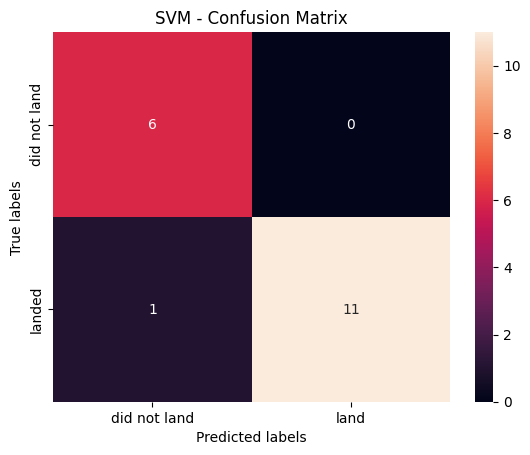

In [27]:
yhat=svm_cv.predict(temp_X_test1)
plot_confusion_matrix(temp_y_test1,yhat, "SVM")

## TASK  8


Create a decision tree classifier object then  create a  <code>GridSearchCV</code> object  <code>tree_cv</code> with cv = 10.  Fit the object to find the best parameters from the dictionary <code>parameters</code>.


In [28]:
tree_parameters = {'criterion': ['gini', 'entropy'],
     'splitter': ['best', 'random'],
     'max_depth': [2*n for n in range(1,10)],
     # 'max_features': ['auto', 'sqrt'],
     'max_features': ['sqrt', 'log2'],
     'min_samples_leaf': [1, 2, 4],
     'min_samples_split': [2, 5, 10]}

tree = DecisionTreeClassifier()

In [29]:
def train_tree(temp_X_train, temp_X_test, temp_Y_train, temp_Y_test):
    temp_tree_parameters = {'criterion': ['gini', 'entropy'],
        'splitter': ['best', 'random'],
        'max_depth': [2*n for n in range(1,10)],
        # 'max_features': ['auto', 'sqrt'],
        'max_features': ['sqrt', 'log2'],
        'min_samples_leaf': [1, 2, 4],
        'min_samples_split': [2, 5, 10]
    }

    temp_tree = DecisionTreeClassifier()

    tree_cv = GridSearchCV(
        estimator=temp_tree,
        param_grid=temp_tree_parameters,
        cv=10,
        scoring='accuracy',
        verbose=2
    )
    tree_cv.fit(temp_X_train, temp_Y_train)

    # print("tuned hpyerparameters :(best parameters) ",tree_cv.best_params_)
    # print("accuracy :",tree_cv.best_score_)

    # tree_score = tree_cv.score(temp_X_test, temp_Y_test)
    # print(tree_score)
    
    return tree_cv

In [30]:
# tree_cv = train_tree(X_train, X_test, Y_train, Y_test)

In [31]:
# print("tuned hpyerparameters :(best parameters) ",tree_cv.best_params_)
# print("accuracy :",tree_cv.best_score_)

## TASK  9


Calculate the accuracy of tree_cv on the test data using the method <code>score</code>:


In [32]:
# tree_score = tree_cv.score(X_test, Y_test)
# print(tree_score)

In [33]:
# results_list["Decision Tree"] = tree_score

We can plot the confusion matrix


In [34]:
# yhat = tree_cv.predict(X_test)
# plot_confusion_matrix(Y_test,yhat, "Decision Tree")

## TASK  10


Create a k nearest neighbors object then  create a  <code>GridSearchCV</code> object  <code>knn_cv</code> with cv = 10.  Fit the object to find the best parameters from the dictionary <code>parameters</code>.


In [35]:
knn_parameters = {'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
              'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
              'p': [1,2]}

KNN = KNeighborsClassifier()

In [36]:
def train_knn(temp_X_train, temp_X_test, temp_Y_train, temp_Y_test):
    temp_knn_parameters = {'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
                'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                'p': [1,2]
        }

    temp_KNN = KNeighborsClassifier()

    knn_cv = GridSearchCV(
        estimator=temp_KNN,
        param_grid=temp_knn_parameters,
        cv=10,
        scoring='accuracy',
        verbose=2
    )
    knn_cv.fit(temp_X_train, temp_Y_train)

    # print("tuned hpyerparameters :(best parameters) ",knn_cv.best_params_)
    # print("accuracy :",knn_cv.best_score_)

    # knn_score = knn_cv.score(temp_X_test, temp_Y_test)
    # print(knn_score)    

    return knn_cv

In [37]:
# knn_cv = train_knn(X_train, X_test, Y_train, Y_test)

In [38]:
# print("tuned hpyerparameters :(best parameters) ",knn_cv.best_params_)
# print("accuracy :",knn_cv.best_score_)

## TASK  11


Calculate the accuracy of knn_cv on the test data using the method <code>score</code>:


In [39]:
# knn_score = knn_cv.score(X_test, Y_test)
# print(knn_score)

In [40]:
# results_list["KNN"] = knn_score

We can plot the confusion matrix


In [41]:
# yhat = knn_cv.predict(X_test)
# plot_confusion_matrix(Y_test,yhat, "KNN")

## TASK  12


Find the method performs best:


In [42]:
# print(results_list)

In [ ]:
# # old code
# lr_name = "Linear Regression"
# svm_name = "SVM"
# tree_name = "Decision Tree"
# knn_name = "KNN"

# repeated_exp_results_dict = {
#     lr_name: [],
#     svm_name: [],
#     tree_name: [],
#     knn_name: [],
# }

# # Run 10 trials
# trial_num = 10
# for _ in tqdm(range(trial_num), desc="Running model evaluations"):
#     temp_X_train, temp_X_test, temp_y_train, temp_y_test = train_test_split(X, Y, test_size=0.2)
    
#     # train and test models
#     # LR
#     temp_lr_model = train_lr(temp_X_train, temp_X_test, temp_y_train, temp_y_test)
#     temp_lr_score = temp_lr_model.score(temp_X_test, temp_y_test)
#     repeated_exp_results_dict[lr_name].append(temp_lr_score)
#     with mlflow.start_run(run_name=lr_name):
#         for k, v in temp_lr_model.best_params_.items():
#                 mlflow.log_param(k, v)
#         mlflow.log_metric("train_accuracy", temp_lr_model.best_score_)
#         mlflow.log_metric("test_accuracy", temp_lr_score)
#         mlflow.sklearn.log_model(temp_lr_model.best_estimator_, artifact_path="model")

#     # SVM
#     temp_svm_model = train_svm(temp_X_train, temp_X_test, temp_y_train, temp_y_test)
#     temp_svm_score = temp_svm_model.score(temp_X_test, temp_y_test)
#     repeated_exp_results_dict[svm_name].append(temp_svm_score)
#     with mlflow.start_run(run_name=svm_name):
#         for k, v in temp_svm_model.best_params_.items():
#                 mlflow.log_param(k, v)
#         mlflow.log_metric("train_accuracy", temp_svm_model.best_score_)
#         mlflow.log_metric("test_accuracy", temp_svm_score)
#         mlflow.sklearn.log_model(temp_svm_model.best_estimator_, artifact_path="model")

#     # DT
#     temp_tree_model = train_tree(temp_X_train, temp_X_test, temp_y_train, temp_y_test)
#     temp_tree_score = temp_tree_model.score(temp_X_test, temp_y_test)
#     repeated_exp_results_dict[tree_name].append(temp_tree_score)
#     with mlflow.start_run(run_name=tree_name):
#         for k, v in temp_tree_model.best_params_.items():
#                 mlflow.log_param(k, v)
#         mlflow.log_metric("train_accuracy", temp_tree_model.best_score_)
#         mlflow.log_metric("test_accuracy", temp_tree_score)
#         mlflow.sklearn.log_model(temp_tree_model.best_estimator_, artifact_path="model")

#     # KNN
#     temp_knn_model = train_knn(temp_X_train, temp_X_test, temp_y_train, temp_y_test)
#     temp_knn_score = temp_knn_model.score(temp_X_test, temp_y_test)
#     repeated_exp_results_dict[knn_name].append(temp_knn_score)
#     with mlflow.start_run(run_name=knn_name):
#         for k, v in temp_knn_model.best_params_.items():
#                 mlflow.log_param(k, v)
#         mlflow.log_metric("train_accuracy", temp_knn_model.best_score_)
#         mlflow.log_metric("test_accuracy", temp_knn_score)
#         mlflow.sklearn.log_model(temp_knn_model.best_estimator_, artifact_path="model")
    

Running model evaluations:   0%|          | 0/10 [00:00<?, ?it/s]

Fitting 10 folds for each of 3 candidates, totalling 30 fits
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.1s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ....................C=0.1, penalty=l2, solver=lbfgs; total time=   0.1s
[CV] END ....................C=0.1, penalty=l2, 

2025/08/01 18:04:04 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/08/01 18:04:11 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run Linear Regression at: http://127.0.0.1:8080/#/experiments/754228530263979258/runs/0f3613c2b6f5468d90c3543fe0effff7
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/754228530263979258
Fitting 10 folds for each of 125 candidates, totalling 1250 fits
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV

2025/08/01 18:04:17 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.


[CV] END .............C=1000.0, gamma=1000.0, kernel=sigmoid; total time=   0.0s
[CV] END .............C=1000.0, gamma=1000.0, kernel=sigmoid; total time=   0.0s
[CV] END .............C=1000.0, gamma=1000.0, kernel=sigmoid; total time=   0.0s
[CV] END .............C=1000.0, gamma=1000.0, kernel=sigmoid; total time=   0.0s
[CV] END .............C=1000.0, gamma=1000.0, kernel=sigmoid; total time=   0.0s
[CV] END .............C=1000.0, gamma=1000.0, kernel=sigmoid; total time=   0.0s
[CV] END .............C=1000.0, gamma=1000.0, kernel=sigmoid; total time=   0.0s
[CV] END .............C=1000.0, gamma=1000.0, kernel=sigmoid; total time=   0.0s


2025/08/01 18:04:20 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run SVM at: http://127.0.0.1:8080/#/experiments/754228530263979258/runs/8dcdb119cee04fb886010a5b7faf67fa
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/754228530263979258
Fitting 10 folds for each of 648 candidates, totalling 6480 fits
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_sampl

2025/08/01 18:04:52 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/08/01 18:04:55 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run Decision Tree at: http://127.0.0.1:8080/#/experiments/754228530263979258/runs/9cee0c0a146949d6a70945f1f8c235ca
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/754228530263979258
Fitting 10 folds for each of 80 candidates, totalling 800 fits
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END 

2025/08/01 18:04:59 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.


[CV] END ................algorithm=brute, n_neighbors=9, p=2; total time=   0.0s
[CV] END ................algorithm=brute, n_neighbors=9, p=2; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=1; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=1; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=1; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=1; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=1; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=1; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=1; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=1; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=1; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=1; total time=   0.0s
[CV] END ...............algo

2025/08/01 18:05:02 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
Running model evaluations:  10%|█         | 1/10 [00:59<08:56, 59.60s/it]

🏃 View run KNN at: http://127.0.0.1:8080/#/experiments/754228530263979258/runs/5f34228b1a7c4fc4ba6f52a98b4c1cc0
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/754228530263979258
Fitting 10 folds for each of 3 candidates, totalling 30 fits
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ............

2025/08/01 18:05:02 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/08/01 18:05:06 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run Linear Regression at: http://127.0.0.1:8080/#/experiments/754228530263979258/runs/e5aa01c147e04b49bcdb36e2d5d0369f
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/754228530263979258
Fitting 10 folds for each of 125 candidates, totalling 1250 fits
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV

2025/08/01 18:05:12 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/08/01 18:05:16 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run SVM at: http://127.0.0.1:8080/#/experiments/754228530263979258/runs/766d6f4239b94a78afa20f3b28039200
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/754228530263979258
Fitting 10 folds for each of 648 candidates, totalling 6480 fits
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_sampl

2025/08/01 18:05:54 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/08/01 18:05:59 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run Decision Tree at: http://127.0.0.1:8080/#/experiments/754228530263979258/runs/c3e40bbbb6d3437c88e8b2ae23418914
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/754228530263979258
Fitting 10 folds for each of 80 candidates, totalling 800 fits
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END 

2025/08/01 18:06:02 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/08/01 18:06:08 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
Running model evaluations:  20%|██        | 2/10 [02:05<08:24, 63.06s/it]

🏃 View run KNN at: http://127.0.0.1:8080/#/experiments/754228530263979258/runs/57b5e74638174bd1a05a4ba8597d19ea
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/754228530263979258
Fitting 10 folds for each of 3 candidates, totalling 30 fits
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ............

2025/08/01 18:06:08 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.


[CV] END ......................C=1, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ......................C=1, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ......................C=1, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ......................C=1, penalty=l2, solver=lbfgs; total time=   0.0s


2025/08/01 18:06:12 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run Linear Regression at: http://127.0.0.1:8080/#/experiments/754228530263979258/runs/337515d22cff49d4931f0c39e1d43bd4
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/754228530263979258
Fitting 10 folds for each of 125 candidates, totalling 1250 fits
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV

2025/08/01 18:06:18 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/08/01 18:06:22 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run SVM at: http://127.0.0.1:8080/#/experiments/754228530263979258/runs/a188ded6ed9c423ba50124bee99d24c2
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/754228530263979258
Fitting 10 folds for each of 648 candidates, totalling 6480 fits
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_sampl

2025/08/01 18:07:17 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/08/01 18:07:23 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run Decision Tree at: http://127.0.0.1:8080/#/experiments/754228530263979258/runs/37a43448ee744228bf238c75f182d23a
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/754228530263979258
Fitting 10 folds for each of 80 candidates, totalling 800 fits
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END 

2025/08/01 18:07:28 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/08/01 18:07:35 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
Running model evaluations:  30%|███       | 3/10 [03:32<08:40, 74.37s/it]

🏃 View run KNN at: http://127.0.0.1:8080/#/experiments/754228530263979258/runs/05d236bd60c6442680090c4be3d3d41b
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/754228530263979258
Fitting 10 folds for each of 3 candidates, totalling 30 fits
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ............

2025/08/01 18:07:36 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/08/01 18:07:42 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run Linear Regression at: http://127.0.0.1:8080/#/experiments/754228530263979258/runs/3866051e31374d6da1fce4fdd2a1fc8d
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/754228530263979258
Fitting 10 folds for each of 125 candidates, totalling 1250 fits
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV

2025/08/01 18:07:51 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/08/01 18:07:58 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run SVM at: http://127.0.0.1:8080/#/experiments/754228530263979258/runs/ebc4dfa082d74675ac4ce6361802a40a
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/754228530263979258
Fitting 10 folds for each of 648 candidates, totalling 6480 fits
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_sampl

2025/08/01 18:08:55 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/08/01 18:09:01 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run Decision Tree at: http://127.0.0.1:8080/#/experiments/754228530263979258/runs/a8add6f0b8074f7cacd3f3b4d12803fb
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/754228530263979258
Fitting 10 folds for each of 80 candidates, totalling 800 fits
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END 

2025/08/01 18:09:07 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/08/01 18:09:15 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
Running model evaluations:  40%|████      | 4/10 [05:12<08:26, 84.39s/it]

🏃 View run KNN at: http://127.0.0.1:8080/#/experiments/754228530263979258/runs/db1f1f80a16f46c9be73ac27c361c5fa
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/754228530263979258
Fitting 10 folds for each of 3 candidates, totalling 30 fits
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ............

2025/08/01 18:09:16 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/08/01 18:09:23 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run Linear Regression at: http://127.0.0.1:8080/#/experiments/754228530263979258/runs/b8901ef2f705437f9041932b83840813
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/754228530263979258
Fitting 10 folds for each of 125 candidates, totalling 1250 fits
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV

2025/08/01 18:09:33 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/08/01 18:09:40 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run SVM at: http://127.0.0.1:8080/#/experiments/754228530263979258/runs/6014d0bac47748b5813b54127d7c84dc
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/754228530263979258
Fitting 10 folds for each of 648 candidates, totalling 6480 fits
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_sampl

2025/08/01 18:10:47 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/08/01 18:10:55 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run Decision Tree at: http://127.0.0.1:8080/#/experiments/754228530263979258/runs/2263af0da125470896b4e05b1d99aa6b
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/754228530263979258
Fitting 10 folds for each of 80 candidates, totalling 800 fits
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END 

2025/08/01 18:11:00 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/08/01 18:11:08 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
Running model evaluations:  50%|█████     | 5/10 [07:05<07:53, 94.66s/it]

🏃 View run KNN at: http://127.0.0.1:8080/#/experiments/754228530263979258/runs/0010d339d2ea45d6bd6bc0ad62f0f4aa
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/754228530263979258
Fitting 10 folds for each of 3 candidates, totalling 30 fits
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ............

2025/08/01 18:11:09 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/08/01 18:11:16 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run Linear Regression at: http://127.0.0.1:8080/#/experiments/754228530263979258/runs/a11b9c73a08f409da58422d3d01f336b
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/754228530263979258
Fitting 10 folds for each of 125 candidates, totalling 1250 fits
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV

2025/08/01 18:11:26 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/08/01 18:11:34 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run SVM at: http://127.0.0.1:8080/#/experiments/754228530263979258/runs/272f12e9be784c36bde2ba097d0ee140
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/754228530263979258
Fitting 10 folds for each of 648 candidates, totalling 6480 fits
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_sampl

2025/08/01 18:12:20 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/08/01 18:12:24 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run Decision Tree at: http://127.0.0.1:8080/#/experiments/754228530263979258/runs/c764ddf317a447d8ba35459227ffb3cb
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/754228530263979258
Fitting 10 folds for each of 80 candidates, totalling 800 fits
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END 

2025/08/01 18:12:28 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/08/01 18:12:32 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
Running model evaluations:  60%|██████    | 6/10 [08:29<06:04, 91.14s/it]

🏃 View run KNN at: http://127.0.0.1:8080/#/experiments/754228530263979258/runs/2e93543e94184111a1b5178bdbe054bb
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/754228530263979258
Fitting 10 folds for each of 3 candidates, totalling 30 fits
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ............

2025/08/01 18:12:33 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/08/01 18:12:37 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run Linear Regression at: http://127.0.0.1:8080/#/experiments/754228530263979258/runs/96bb0379b01b403c8d2be3bc533c781f
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/754228530263979258
Fitting 10 folds for each of 125 candidates, totalling 1250 fits
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV

2025/08/01 18:12:41 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/08/01 18:12:45 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run SVM at: http://127.0.0.1:8080/#/experiments/754228530263979258/runs/26aeaf25acb741a9a5ad3d4edbbc3122
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/754228530263979258
Fitting 10 folds for each of 648 candidates, totalling 6480 fits
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_sampl

2025/08/01 18:13:46 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/08/01 18:13:54 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run Decision Tree at: http://127.0.0.1:8080/#/experiments/754228530263979258/runs/9753c9c75b8547998e7a4bcb7d7f7c6b
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/754228530263979258
Fitting 10 folds for each of 80 candidates, totalling 800 fits
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END 

2025/08/01 18:13:59 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/08/01 18:14:08 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
Running model evaluations:  70%|███████   | 7/10 [10:05<04:37, 92.62s/it]

🏃 View run KNN at: http://127.0.0.1:8080/#/experiments/754228530263979258/runs/f465a3c62a4e4e8aa0e9e284ea32022d
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/754228530263979258
Fitting 10 folds for each of 3 candidates, totalling 30 fits
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ............

2025/08/01 18:14:09 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/08/01 18:14:16 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run Linear Regression at: http://127.0.0.1:8080/#/experiments/754228530263979258/runs/c738d92dab5c44dc80ea331025442a5d
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/754228530263979258
Fitting 10 folds for each of 125 candidates, totalling 1250 fits
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV

2025/08/01 18:14:26 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/08/01 18:14:34 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run SVM at: http://127.0.0.1:8080/#/experiments/754228530263979258/runs/a85e31c2cda743eab2f701c8c8789f1f
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/754228530263979258
Fitting 10 folds for each of 648 candidates, totalling 6480 fits
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_sampl

2025/08/01 18:15:44 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/08/01 18:15:53 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run Decision Tree at: http://127.0.0.1:8080/#/experiments/754228530263979258/runs/a8a0fe20197d4868b7cf99ddf1458124
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/754228530263979258
Fitting 10 folds for each of 80 candidates, totalling 800 fits
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END 

2025/08/01 18:15:59 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/08/01 18:16:08 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
Running model evaluations:  80%|████████  | 8/10 [12:05<03:22, 101.49s/it]

🏃 View run KNN at: http://127.0.0.1:8080/#/experiments/754228530263979258/runs/af494ec7c653444fbace3ed2a704cdc4
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/754228530263979258
Fitting 10 folds for each of 3 candidates, totalling 30 fits
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ............

2025/08/01 18:16:10 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/08/01 18:16:17 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run Linear Regression at: http://127.0.0.1:8080/#/experiments/754228530263979258/runs/83b5c694ccc346cf9b0109732f11bead
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/754228530263979258
Fitting 10 folds for each of 125 candidates, totalling 1250 fits
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV

2025/08/01 18:16:30 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/08/01 18:16:38 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run SVM at: http://127.0.0.1:8080/#/experiments/754228530263979258/runs/b5424f01f5f54a31a9a25fbce9c06e47
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/754228530263979258
Fitting 10 folds for each of 648 candidates, totalling 6480 fits
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_sampl

2025/08/01 18:17:48 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/08/01 18:17:57 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run Decision Tree at: http://127.0.0.1:8080/#/experiments/754228530263979258/runs/c177d5bc4d9940939f1bcdbcdb390bbb
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/754228530263979258
Fitting 10 folds for each of 80 candidates, totalling 800 fits
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END 

2025/08/01 18:18:05 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/08/01 18:18:13 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
Running model evaluations:  90%|█████████ | 9/10 [14:10<01:48, 108.70s/it]

🏃 View run KNN at: http://127.0.0.1:8080/#/experiments/754228530263979258/runs/a8aab546927a4faea0ca02842f7aa589
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/754228530263979258
Fitting 10 folds for each of 3 candidates, totalling 30 fits
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ............

2025/08/01 18:18:14 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/08/01 18:18:22 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run Linear Regression at: http://127.0.0.1:8080/#/experiments/754228530263979258/runs/ad685170d0594e0ea94b5d3e816c1793
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/754228530263979258
Fitting 10 folds for each of 125 candidates, totalling 1250 fits
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV

2025/08/01 18:18:33 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/08/01 18:18:42 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run SVM at: http://127.0.0.1:8080/#/experiments/754228530263979258/runs/fc4b83810a2c4153a812473f638e4d97
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/754228530263979258
Fitting 10 folds for each of 648 candidates, totalling 6480 fits
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_sampl

2025/08/01 18:19:27 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/08/01 18:19:33 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run Decision Tree at: http://127.0.0.1:8080/#/experiments/754228530263979258/runs/8a555a5c5e044132be2dcd8d8fee1fb4
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/754228530263979258
Fitting 10 folds for each of 80 candidates, totalling 800 fits
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END 

2025/08/01 18:19:37 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.


[CV] END ...............algorithm=brute, n_neighbors=10, p=2; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=2; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=2; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=2; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=2; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=2; total time=   0.0s


2025/08/01 18:19:48 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
Running model evaluations: 100%|██████████| 10/10 [15:46<00:00, 94.60s/it] 

🏃 View run KNN at: http://127.0.0.1:8080/#/experiments/754228530263979258/runs/53159c33fc7546fbb8cf3733ce2ff59a
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/754228530263979258


In [ ]:
lr_name = "Linear Regression"
svm_name = "SVM"
tree_name = "Decision Tree"
knn_name = "KNN"

models = [
    ("Linear Regression", train_lr),
    ("SVM",               train_svm),
    ("Decision Tree",     train_tree),
    ("KNN",               train_knn),
]
trial_num = 10

mlflow.set_experiment("gridsearch_summary-2")
for model_name, train_fn in tqdm(models):
    scores = []
    with mlflow.start_run(run_name=model_name):
        # tag the run so you can filter/group by it in the UI
        mlflow.set_tag("model", model_name)

        for i in range(trial_num):
            Xtr, Xte, ytr, yte = train_test_split(X, Y, test_size=0.2, random_state=i)
            gs = train_fn(Xtr, Xte, ytr, yte)     # your wrapper that returns a fitted GridSearchCV
            test_acc = gs.score(Xte, yte)
            scores.append(test_acc)

            # log each trial under the same metric, different step
            # mlflow.log_metric("test_accuracy", test_acc, step=i)
            # mlflow.sklearn.log_model(gs.best_estimator_, artifact_path="model", step=i)
            # ── NESTED CHILD RUN ─────────────────────────────────────────
            with mlflow.start_run(run_name=f"{model_name}_trial_{i}", nested=True):
                # log the best‐params from THIS trial
                for k, v in gs.best_params_.items():
                    mlflow.log_param(k, v)

                # log train & test accuracies
                mlflow.log_metric("train_accuracy", gs.best_score_)
                mlflow.log_metric("test_accuracy",  test_acc)

                # log the fitted model artifact
                mlflow.sklearn.log_model(gs.best_estimator_, artifact_path="model")

        # finally, log the aggregate
        mean_acc = np.mean(scores)
        mlflow.log_param("model", model_name)
        mlflow.log_metric("mean_test_accuracy", mean_acc)

2025/08/01 18:46:38 INFO mlflow.tracking.fluent: Experiment with name 'gridsearch_summary-2' does not exist. Creating a new experiment.
  0%|          | 0/4 [00:00<?, ?it/s]

Fitting 10 folds for each of 3 candidates, totalling 30 fits
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ....................C=0.1, penalty=l2, solver=lbfgs; total time=   0.1s
[CV] END ....................C=0.1, penalty=l2, 

2025/08/01 18:46:40 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/08/01 18:46:47 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
 25%|██▌       | 1/4 [00:09<00:27,  9.18s/it]

🏃 View run Linear Regression_trial_0 at: http://127.0.0.1:8080/#/experiments/597039470532417865/runs/c8786753f7504a32b6c7e47f31715b55
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/597039470532417865
🏃 View run Linear Regression at: http://127.0.0.1:8080/#/experiments/597039470532417865/runs/d3713a32e8754160bde7a6d2686f4c48
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/597039470532417865
Fitting 10 folds for each of 125 candidates, totalling 1250 fits
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, g

2025/08/01 18:46:55 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/08/01 18:46:59 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
 50%|█████     | 2/4 [00:21<00:21, 10.80s/it]

🏃 View run SVM_trial_0 at: http://127.0.0.1:8080/#/experiments/597039470532417865/runs/16733bc6c80e49ad8d62c956d076da8e
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/597039470532417865
🏃 View run SVM at: http://127.0.0.1:8080/#/experiments/597039470532417865/runs/2ff1e468c685489da3fafc5438299238
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/597039470532417865
Fitting 10 folds for each of 648 candidates, totalling 6480 fits
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best; total time=   0.0s
[CV] END criterion=gi

2025/08/01 18:47:26 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/08/01 18:47:30 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
 75%|███████▌  | 3/4 [00:52<00:19, 19.99s/it]

🏃 View run Decision Tree_trial_0 at: http://127.0.0.1:8080/#/experiments/597039470532417865/runs/70fba33e930847228f07df739d7ee873
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/597039470532417865
🏃 View run Decision Tree at: http://127.0.0.1:8080/#/experiments/597039470532417865/runs/3102e07bc2ac49cf9f26d3088c3e064e
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/597039470532417865
Fitting 10 folds for each of 80 candidates, totalling 800 fits
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_neighbors=1, p=1; total time=   0.0s
[CV] END .................algorithm=auto, n_n

2025/08/01 18:47:33 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/08/01 18:47:37 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
100%|██████████| 4/4 [00:59<00:00, 14.91s/it]

🏃 View run KNN_trial_0 at: http://127.0.0.1:8080/#/experiments/597039470532417865/runs/8b9612436b8e4803b2027eeae8f90e86
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/597039470532417865
🏃 View run KNN at: http://127.0.0.1:8080/#/experiments/597039470532417865/runs/c6ca192efe0f43e493f7959935cb346b
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/597039470532417865


In [44]:
mean_accuracy_dict = {}
for mdl_name, mdl_results in repeated_exp_results_dict.items():
    mean_accuracy_dict[mdl_name] = np.mean(mdl_results)

In [45]:
def display_model_compare(data):
    # Convert to DataFrame
    temp_df = pd.DataFrame(list(data.items()), columns=['Model', 'Accuracy'])

    # Set Seaborn theme
    sns.set_theme(style='whitegrid')

    # Create barplot
    plt.figure(figsize=(8, 5))
    barplot = sns.barplot(data=temp_df, x='Model', y='Accuracy', palette='Set2')

    # Annotate bars with values
    for p in barplot.patches:
        barplot.annotate(f"{p.get_height():.2f}", (p.get_x() + p.get_width() / 2, p.get_height()),
                        ha='center', va='bottom', fontsize=10, color='black')

    # Title and labels
    plt.title('Model Accuracy Comparison', fontsize=14)
    plt.ylim(0, 1.05)
    plt.ylabel('Accuracy')
    plt.xlabel('Model')

    # Show plot
    plt.tight_layout()
    plt.show()


/tmp/ipykernel_23586/1239534612.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(data=temp_df, x='Model', y='Accuracy', palette='Set2')


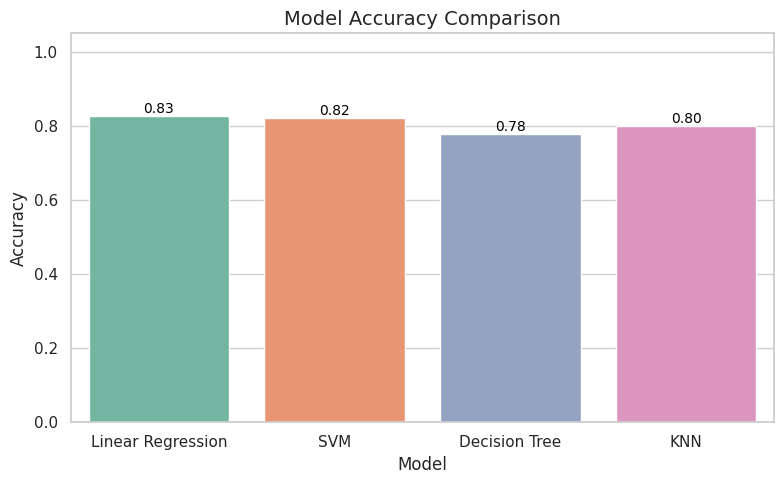

In [46]:
display_model_compare(mean_accuracy_dict)

## Authors


[Pratiksha Verma](https://www.linkedin.com/in/pratiksha-verma-6487561b1/)


<!--## Change Log--!>


<!--| Date (YYYY-MM-DD) | Version | Changed By      | Change Description      |
| ----------------- | ------- | -------------   | ----------------------- |
| 2022-11-09        | 1.0     | Pratiksha Verma | Converted initial version to Jupyterlite|--!>


### <h3 align="center"> IBM Corporation 2022. All rights reserved. <h3/>
